In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 24 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,690 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from skimage import data
import pytesseract
from pytesseract import Output
from PIL import Image

import re

# Preprocessing

Load IPhone Captured Image of Graph

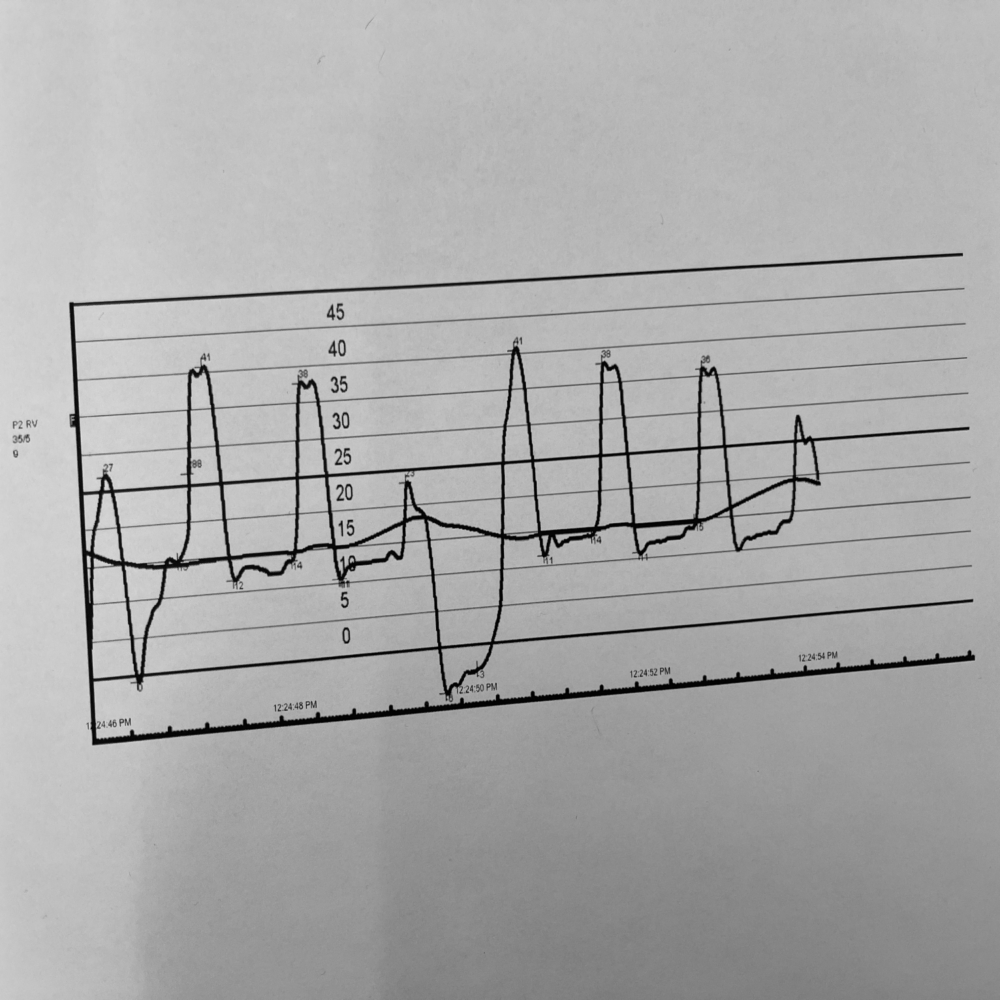

In [ ]:
# Load the image
original_image = cv2.imread('IMG_4098.jpg')

# Resize and scale the image
height, width = 1500, 1500  # Set your desired dimensions
original_image = cv2.resize(original_image, (width, height))

# Convert to grayscale
image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image)

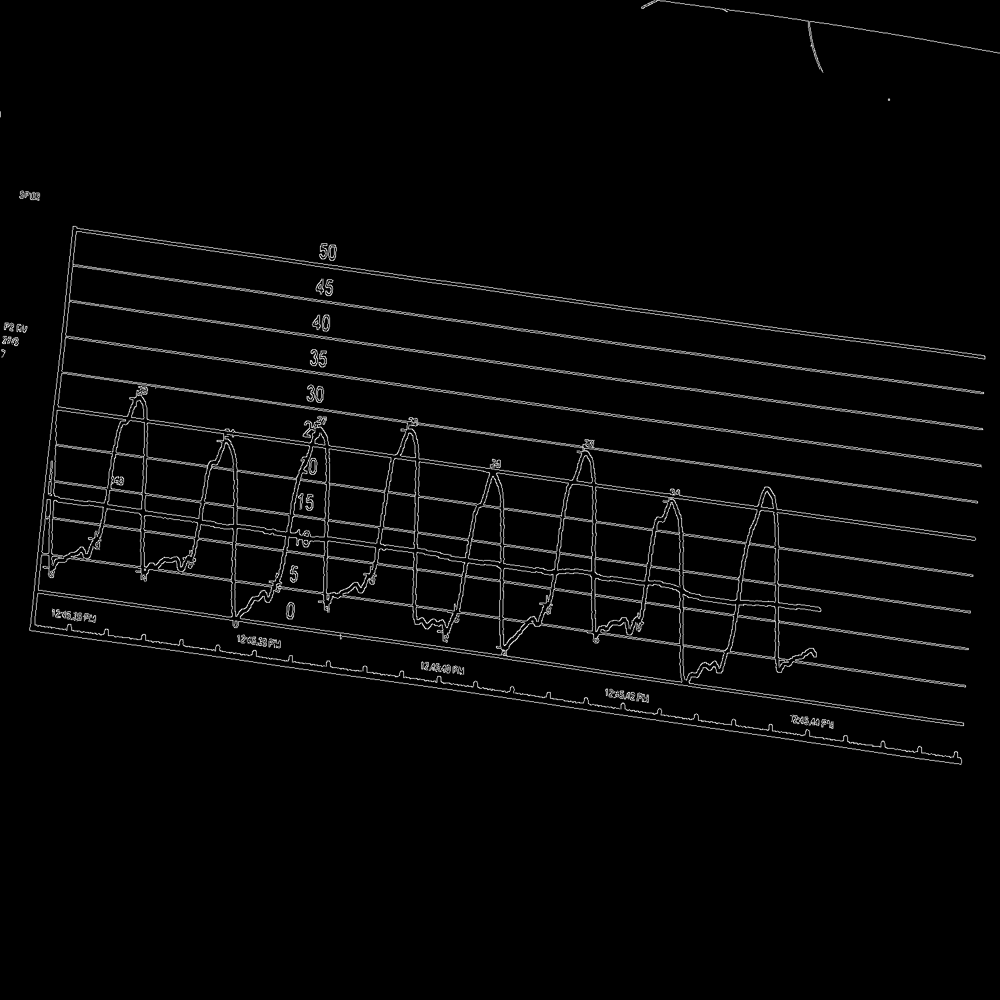

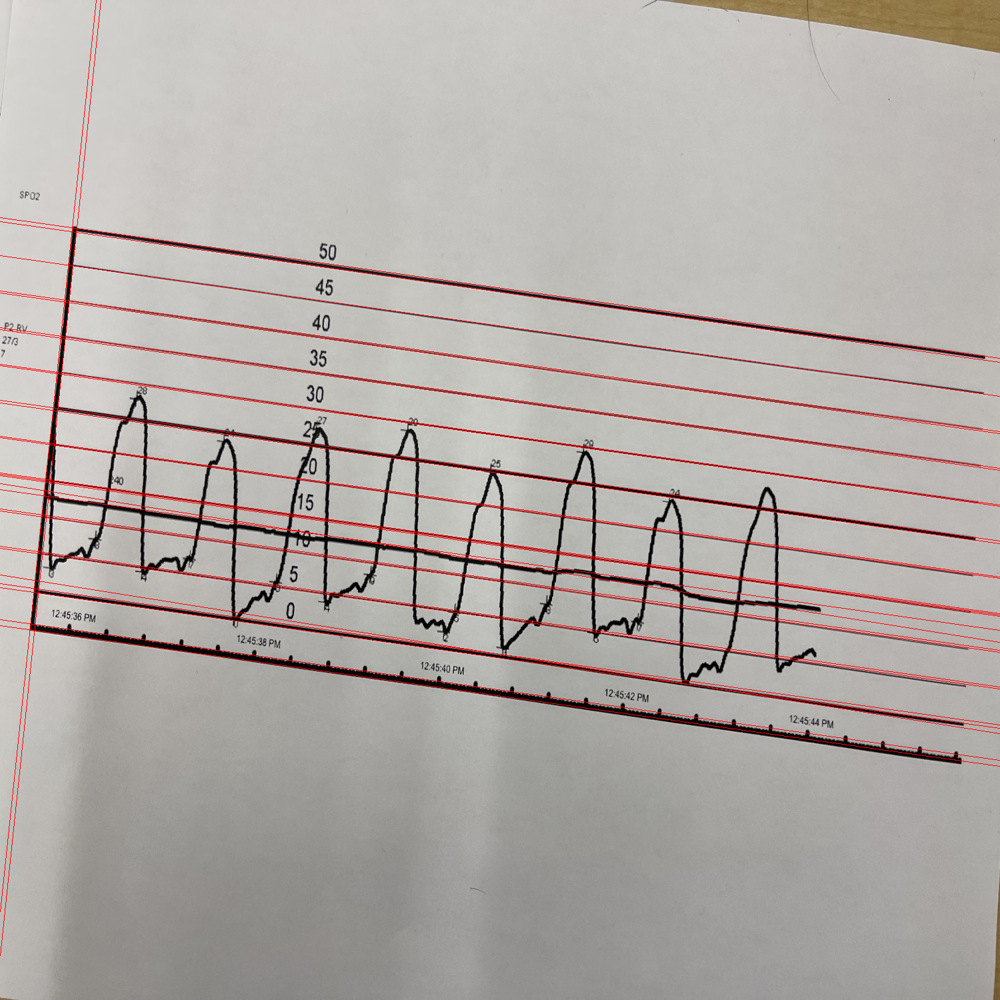

In [ ]:
# Perform edge detection
edges = cv2.Canny(image, threshold1=30, threshold2=500)
cv2_imshow(edges)

# Perform Hough Line Transform
lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=250)

image_copy = original_image.copy()

# Draw the lines on the original image
if lines is not None:
    for rho, theta in lines[:, 0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 5000 * (-b))
        y1 = int(y0 + 5000 * (a))
        x2 = int(x0 - 5000 * (-b))
        y2 = int(y0 - 5000 * (a))
        cv2.line(image_copy, (x1, y1), (x2, y2), (0, 0, 255), 1)

cv2_imshow(image_copy)

In [ ]:
# Filter the detected lines based on their angle (vertical or horizontal)
vertical_lines = []
horizontal_lines = []

for rho, theta in lines[:, 0]:
    angle_degrees = np.degrees(theta)
    angle_threshold = 45

    if angle_degrees >= 180:
      angle_degrees -= 180

    if (angle_degrees >= 0 and angle_degrees < angle_threshold) or (angle_degrees > (90 + angle_threshold)):
        vertical_lines.append((rho, theta))
    else:
        horizontal_lines.append((rho, theta))

print(vertical_lines)
print(horizontal_lines)

[(-86.0, 3.0892327), (-79.0, 3.0892327)]
[(691.0, 1.5009831), (689.0, 1.5009831), (970.0, 1.4835298), (459.0, 1.5184364), (635.0, 1.5009831), (637.0, 1.5009831), (1027.0, 1.4835298), (917.0, 1.4835298), (973.0, 1.4835298), (1023.0, 1.4835298), (464.0, 1.5184364), (582.0, 1.5009831), (744.0, 1.5009831), (914.0, 1.4835298), (584.0, 1.5009831), (517.0, 1.5184364), (530.0, 1.5009831), (748.0, 1.5009831), (514.0, 1.5184364), (797.0, 1.5009831), (864.0, 1.4835298), (573.0, 1.5184364), (795.0, 1.5009831), (1126.0, 1.4660766), (847.0, 1.5009831), (1115.0, 1.4835298), (527.0, 1.5009831), (868.0, 1.4835298), (920.0, 1.4835298), (632.0, 1.5009831)]


In [ ]:
image_copy = original_image.copy()

# print(len(horizontal_lines))

largest_rho = 0
largest_theta = 0
largest_val = 0

# Draw the lines on the original image
for rho, theta in horizontal_lines:
  # rho, theta = horizontal_lines[8]
  # print(np.degrees(theta))
  if(rho*np.sin(theta) > largest_val):
    largest_val = rho*np.sin(theta)
    largest_rho = rho
    largest_theta = theta
  # print(np.degrees(theta))
a = np.cos(largest_theta)
b = np.sin(largest_theta)
x0 = a * largest_rho
y0 = b * largest_rho
x1 = int(x0 + 5000 * (-b))
y1 = int(y0 + 5000 * (a))
x2 = int(x0 - 5000 * (-b))
y2 = int(y0 - 5000 * (a))
# cv2.line(image_copy, (x1, y1), (x2, y2), (0, 0, 255), 1)

# cv2_imshow(image_copy)

# Create a mask image to isolate the region around the line
mask = np.zeros_like(edges)
roi_color = (255, 255, 255)  # Color of the ROI in the mask (white)

# Draw a line on the mask
cv2.line(mask, (x1, y1), (x2, y2), roi_color, 5)
# print((x1, y1), (x2, y2))
# Apply the mask to the Canny edge map
masked_line = cv2.bitwise_and(edges, mask)
# cv2_imshow(masked_line)

# Find the endpoints of the line within the ROI
y, x = np.where(masked_line > 0)
bottom_line_start_x = min(x)
bottom_line_end_x = max(x)
bottom_line_start_y = min(y)
bottom_line_end_y = max(y)
# print((bottom_line_start_x,bottom_line_end_x),(bottom_line_start_y,bottom_line_end_y))

# You can visualize the line within the ROI by drawing it on the original image
if np.degrees(largest_theta) > 90:
  bottom_left = [bottom_line_start_x, bottom_line_start_y]
  bottom_right = [bottom_line_end_x, bottom_line_end_y]
  cv2.line(image_copy, (bottom_line_start_x, bottom_line_start_y), (bottom_line_end_x, bottom_line_end_y), (0, 0, 255), 2)
else:
  bottom_left = [bottom_line_start_x, bottom_line_end_y]
  bottom_right = [bottom_line_end_x, bottom_line_start_y]
  cv2.line(image_copy, (bottom_line_start_x, bottom_line_end_y), (bottom_line_end_x, bottom_line_start_y), (0, 0, 255), 2)

print()
# Show the image with the line within the ROI
# cv2_imshow(image_copy)

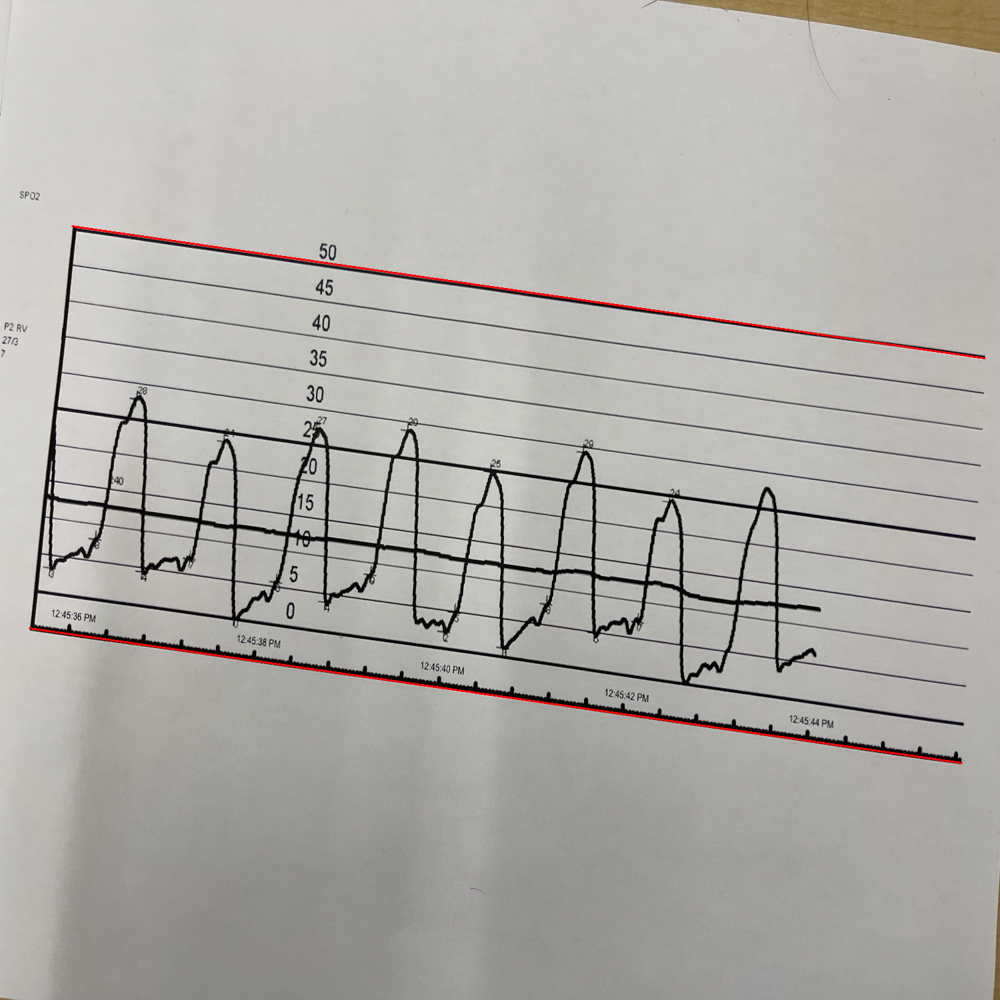

In [ ]:
# print(len(horizontal_lines))

smallest_rho, smallest_theta = horizontal_lines[0]
smallest_val = smallest_rho*np.sin(smallest_theta)

# Draw the lines on the original image
for rho, theta in horizontal_lines[1:]:
  # rho, theta = horizontal_lines[8]
  # print(rho)
  if(rho*np.sin(theta) < smallest_val):
    smallest_val = rho*np.sin(theta)
    smallest_rho = rho
    smallest_theta = theta
  # print(np.degrees(theta))
a = np.cos(smallest_theta)
b = np.sin(smallest_theta)
x0 = a * smallest_rho
y0 = b * smallest_rho
x1 = int(x0 + 5000 * (-b))
y1 = int(y0 + 5000 * (a))
x2 = int(x0 - 5000 * (-b))
y2 = int(y0 - 5000 * (a))
# cv2.line(image_copy, (x1, y1), (x2, y2), (0, 0, 255), 1)

# cv2_imshow(image_copy)

# Create a mask image to isolate the region around the line
mask = np.zeros_like(edges)
roi_color = (255, 255, 255)  # Color of the ROI in the mask (white)
# cv2_imshow(masked_line)

# Draw a line on the mask
cv2.line(mask, (x1, y1), (x2, y2), roi_color, 5)

# Apply the mask to the Canny edge map
masked_line = cv2.bitwise_and(edges, mask)

# Find the endpoints of the line within the ROI
y, x = np.where(masked_line > 0)
top_line_start_x = min(x)
top_line_end_x = max(x)
top_line_start_y = min(y)
top_line_end_y = max(y)

# print(np.degrees(theta))

# You can visualize the line within the ROI by drawing it on the original image
# print(np.degrees(smallest_theta))
if np.degrees(smallest_theta) > 90:
  top_left = [top_line_start_x, top_line_start_y]
  top_right = [top_line_end_x, top_line_end_y]
  cv2.line(image_copy, (top_line_start_x, top_line_start_y), (top_line_end_x, top_line_end_y), (0, 0, 255), 2)
else:
  top_left = [top_line_start_x, top_line_end_y]
  top_right = [top_line_end_x, top_line_start_y]
  cv2.line(image_copy, (top_line_start_x, top_line_end_y), (top_line_end_x, top_line_start_y), (0, 0, 255), 2)

# Show the image with the line within the ROI
cv2_imshow(image_copy)

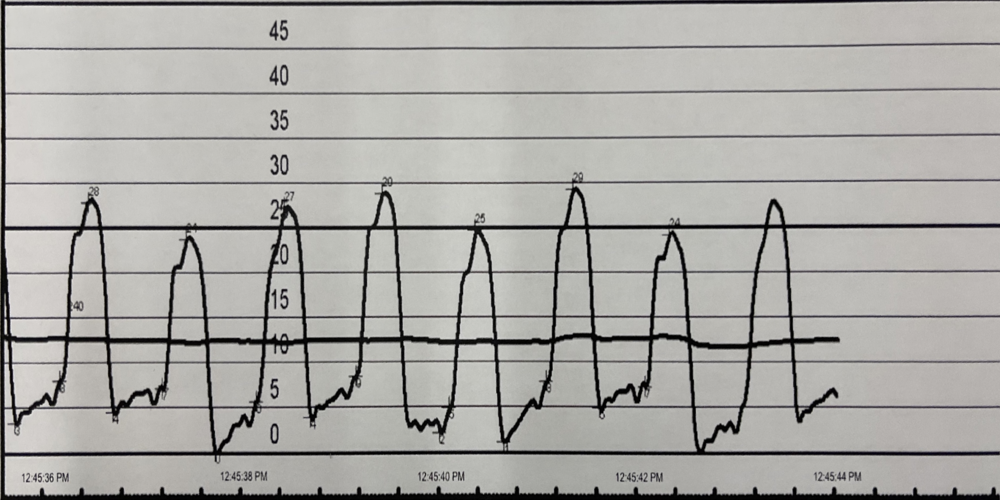

In [ ]:
image_copy = original_image.copy()

# Define the corners of the desired rectangle
# print((bottom_line_start_x, bottom_line_start_y), (top_line_start_x,top_line_start_y), (top_line_end_x,top_line_end_y), (bottom_line_end_x,bottom_line_end_y))
rect_corners = np.array([bottom_left, top_left, top_right, bottom_right], dtype=np.float32)

# Define the corresponding rectangle corners in the desired output
output_corners = np.array([[0, 1500], [0, 0], [3000, 0], [3000, 1500]], dtype=np.float32)

# Calculate the perspective transformation (homography matrix)
H, _ = cv2.findHomography(rect_corners, output_corners)

# Warp the image to the rectangular shape
rectified_image = cv2.warpPerspective(image_copy, H, (3000, 1500))

# rectified_image = rectified_image[50:750,50:1050]

cv2.imwrite('rectified_image.jpg', rectified_image)

cv2_imshow(rectified_image)

# Run block below is FOR NO AUGMENTATION LOADING

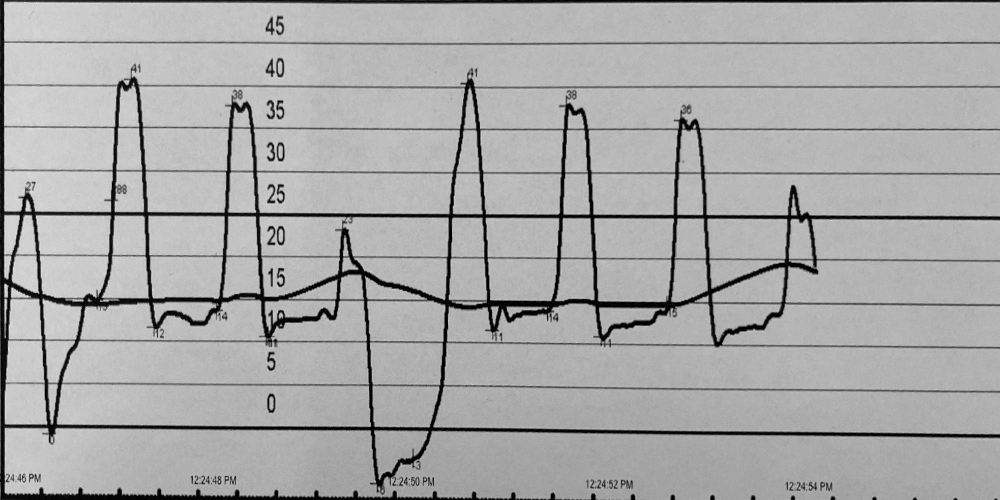

In [ ]:
# THIS IS FOR NO AUGMENTATION LOADING, IMAGE IS ALREADY RECTIFIED
# Load the image
rectified_image = cv2.imread('1214_rectified.jpg')

# Convert to grayscale
image = cv2.cvtColor(rectified_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [ ]:
# Convert the PIL Image to an OpenCV format (BGR)
# Load your image
# image_path = 'img1.jpeg'
# img = cv2.imread(image_path)
# gray = cv2.cvtColor(rectified_image, cv2.COLOR_BGR2GRAY)

# Resize the image - upscale by 2x
img = cv2.resize(rectified_image, None, fx=6, fy=6, interpolation=cv2.INTER_CUBIC)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# # Apply adaptive thresholding
# thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# # Apply a sharpening filter
# kernel = np.array([[-1, -1, -1], [-1, 15, -1], [-1, -1, -1]])
# sharpened = cv2.filter2D(thresh, -1, kernel)

# Display the result
plt.imshow(gray, cmap='gray')
plt.axis('off')
plt.show()

#OCR

In [ ]:
# Apply OCR to the image with custom configuration
custom_config = r'--oem 3 --psm 11' #11 or 12, goes from 0-12
details = pytesseract.image_to_data(img, output_type=Output.DICT, config=custom_config)

image_copy = img.copy()

# Function to check if two x-coordinates are close enough to be considered in the same column
def in_same_column(x1, x2, threshold=10):
    return abs(x1 - x2) <= threshold

# Group text by vertical alignment
columns = {}
for i in range(len(details['text'])):
    if int(details['conf'][i]) > 50:  # Confidence threshold
        (x, y, w, h) = (details['left'][i], details['top'][i], details['width'][i], details['height'][i])
        center_x = x + w / 2

        # Find a column to append or create a new column
        found_column = False
        for col_x in columns.keys():
            if in_same_column(col_x, center_x):
                columns[col_x].append(center_x)
                found_column = True
                break

        if not found_column:
            columns[center_x] = [center_x]

        # Draw rectangle around the text
        cv2.rectangle(image_copy, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Identify the column with the most elements
max_column = max(columns, key=lambda k: len(columns[k]), default=None)

# Draw vertical line for the largest group
if max_column is not None:
    avg_x = int(np.mean(columns[max_column]))
    cv2.line(image_copy, (avg_x, 0), (avg_x, img.shape[0]), (255, 0, 0), 2)

# Show the image with the line
# plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
# plt.title("Image with Vertical Line for Most Aligned Text")
# plt.show()
cv2_imshow(image_copy)

In [ ]:
# Function to check if an x-coordinate is in the max_column
def is_in_max_column(x, avg_x, threshold=10):
    return abs(x - avg_x) <= threshold

# Filter OCR results to include only text elements from the max_column
y_coords_values = []
for i in range(len(details['text'])):
    if int(details['conf'][i]) > 50:  # Confidence threshold
        (x, y, w, h) = (details['left'][i], details['top'][i], details['width'][i], details['height'][i])
        center_x = x + w // 2
        if is_in_max_column(center_x, avg_x):  # Check if it's in the same column as max_column
            print(details['text'][i])
            y_coords_values.append((y + h // 2, details['text'][i]))  # Center y coordinate and text

# Filter out non-numeric values
y_coords_values = [(y, int(value)) for y, value in y_coords_values if value.isnumeric() and int(value) > 0 and (int(value) % 5 == 0 or int(value) % 10 == 0)]
# Sort by y-coordinate in descending order because y-coordinates are inverted in image arrays
y_coords_values.sort(key=lambda item: item[0], reverse=True)

def is_valid_distance(point1, point2):
    distance = abs(point1[1] - point2[1])
    return distance == 5 or distance == 10

# Filter points based on the distance criteria
filtered_points = []
for i in range(len(y_coords_values) - 1):
    if is_valid_distance(y_coords_values[i], y_coords_values[i + 1]):
        filtered_points.append(y_coords_values[i])
        filtered_points.append(y_coords_values[i + 1])

# Removing duplicates if any
filtered_points = list(set(filtered_points))

y_coords_values = filtered_points
print(y_coords_values)

# Calculate scale (units per pixel) using the first two numeric labels
if len(y_coords_values) >= 2:
    (y1, value1), (y2, value2) = y_coords_values[:2]
    pixel_distance = y2 - y1
    value_difference = int(value2) - int(value1)
    scaleY = abs(value_difference / pixel_distance)
    print(f"Each pixel corresponds to {scaleY} units on the y-axis.")
else:
    print("Not enough data to calculate the scale.")

print(img.shape)


oi
o
|
ui
[]
Not enough data to calculate the scale.
(1500, 2985)


# X axis

In [ ]:
# Function to check if two y-coordinates are close enough to be considered in the same line
def in_same_line(y1, y2, threshold=50):
    return abs(y1 - y2) <= threshold

# Group text by horizontal alignment
lines = {}
image_copy = img.copy()

for i in range(len(details['text'])):
    if int(details['conf'][i]) > 50:  # Confidence threshold
        (x, y, w, h) = (details['left'][i], details['top'][i], details['width'][i], details['height'][i])
        bottom_y = y + h

        # Find a line to append or create a new line
        found_line = False
        for line_y in lines.keys():
            if in_same_line(line_y, bottom_y):
                lines[line_y].append(bottom_y)
                found_line = True
                break

        if not found_line:
            lines[bottom_y] = [bottom_y]

        # Draw rectangle around the text
        cv2.rectangle(image_copy, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Identify the line with the most elements
max_line = max(lines, key=lambda k: len(lines[k]), default=None)

# Draw horizontal line for the largest group
avg_y = int(np.mean(lines[max_line]))
cv2.line(image_copy, (0, avg_y), (img.shape[1], avg_y), (255, 0, 0), 50)

# Show the image with the line
cv2_imshow(image_copy)

In [ ]:
import datetime
import re

# Filter OCR results to include only text elements from the max_line
x_coords_times = []
for i in range(len(details['text'])):
    if int(details['conf'][i]) > 50:  # Confidence threshold
        (x, y, w, h) = (details['left'][i], details['top'][i], details['width'][i], details['height'][i])
        bottom_y = y + h
        if in_same_line(avg_y, bottom_y):  # Check if it's in the same line as max_line
            x_coords_times.append((x + w // 2, details['text'][i]))  # Center x coordinate and text

print(x_coords_times)

# Function to check if the string is a valid time
def is_valid_time(time_str):
    # Regular expression to match time in HH:MM:SS format
    return re.match(r'^\d{1,2}:\d{2}:\d{2}$', time_str)

# Filter OCR results to include only valid time strings
x_coords_times = [(x, value) for x, value in x_coords_times if is_valid_time(value)]


# Function to parse time string (assuming AM/PM is not provided and times are in 24-hour format)
def parse_time(time_str):
    try:
        return datetime.datetime.strptime(time_str, '%H:%M:%S')
    except ValueError:
        return None

# Filter and parse time values
x_coords_times = [(x, parse_time(value)) for x, value in x_coords_times if parse_time(value) is not None]

print(x_coords_times)

def time_to_seconds(time_str):
    time_obj = datetime.datetime.strptime(time_str, '%H:%M:%S')
    return time_obj.second

# Convert time values to seconds
x_coords_seconds = [(x, time_to_seconds(value.strftime('%H:%M:%S'))) for x, value in x_coords_times if value is not None]



# Sort by x-coordinate
x_coords_seconds.sort(key=lambda item: item[0])

# Calculate scale (time per pixel) using the first two time labels
if len(x_coords_seconds) >= 2:
    (x1, time1), (x2, time2) = x_coords_seconds[:2]
    pixel_distance = x2 - x1
    time_difference = (time2 - time1)
    scale = abs(time_difference / pixel_distance)
    print(f"Each pixel corresponds to {scale} seconds on the x-axis.")
else:
    print("Not enough data to calculate the scale.")


[(288, '24:40'), (626, 'PM'), (3713, '12:24:48'), (4146, 'PM'), (7353, '24:50')]
[(3713, datetime.datetime(1900, 1, 1, 12, 24, 48))]
Not enough data to calculate the scale.


In [ ]:
image_copy = img.copy()

# Perform edge detection
edges = cv2.Canny(image_copy, threshold1=30, threshold2=100)

# Perform Hough Line Transform
lines = cv2.HoughLines(edges, 1, np.pi / 180, threshold=650)

# Initialize variables
closest_line = None
min_distance = np.inf
target_y = avg_y  # Set this to your desired y-value

if lines is not None:
    for rho, theta in lines[:, 0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho

        x1 = int(x0 + 5000 * (-b))
        y1 = int(y0 + 5000 * (a))
        x2 = int(x0 - 5000 * (-b))
        y2 = int(y0 - 5000 * (a))

        # Find y-value of this line that is closest to but below target_y
        closest_y = min(y1, y2, key=lambda y: target_y - y if target_y >= y else np.inf)

        # Calculate distance from target_y
        if closest_y <= target_y:
            distance = target_y - closest_y
            if distance < min_distance:
                min_distance = distance
                closest_line = (x1, closest_y, x2, closest_y)

# Draw the closest line
if closest_line is not None:
    cv2.line(image_copy, (closest_line[0], closest_line[1]), (closest_line[2], closest_line[3]), (0, 0, 255), 2)
    print("X-axis is at: ", closest_line[1], " pixels high")

else:
    print("No line detected")

cv2_imshow(image_copy)

X-axis is at:  7814  pixels high


In [ ]:
(x1, time1) =  x_coords_seconds[0]
print("A point on the x-axis is at ", x1, "pixels to the right and its value is", time1)
print(img.shape)

A point on the x-axis is at  3713 pixels to the right and its value is 48
(9000, 18000, 3)


# Graph Segmentation

In [ ]:
rectified_image

array([[[ 62,  74,  76],
        [ 31,  40,  43],
        [  3,   8,  11],
        ...,
        [  7,   4,   6],
        [ 30,  27,  29],
        [ 77,  76,  78]],

       [[ 58,  70,  72],
        [ 27,  36,  39],
        [  1,   6,   9],
        ...,
        [  9,   6,   8],
        [ 31,  28,  30],
        [ 77,  76,  78]],

       [[ 56,  68,  70],
        [ 24,  33,  36],
        [  0,   4,   7],
        ...,
        [ 11,   8,  10],
        [ 33,  30,  32],
        [ 77,  76,  78]],

       ...,

       [[ 93,  98, 101],
        [ 52,  57,  60],
        [ 13,  16,  20],
        ...,
        [160, 163, 167],
        [159, 164, 167],
        [160, 165, 168]],

       [[ 95, 102, 105],
        [ 57,  64,  67],
        [ 20,  25,  28],
        ...,
        [160, 164, 165],
        [160, 165, 168],
        [159, 164, 167]],

       [[102, 109, 112],
        [ 67,  74,  77],
        [ 36,  41,  44],
        ...,
        [162, 166, 167],
        [162, 167, 170],
        [159, 164, 167]]

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

### Notch Reject Filter

The `notch_reject_filter` function creates a filter mask in the frequency domain to attenuate specific frequency components. It accepts the shape of the filter mask and parameters that define the location and size of the notch. This function will create a binary mask where the notch regions (around the specified frequencies) are set to 0, and all other regions are set to 1.

In [ ]:
def notch_reject_filter(shape, d0=9, u_k=0, v_k=0):
    P, Q = shape
    u, v = np.meshgrid(np.arange(P), np.arange(Q), indexing='ij')
    D_uv = np.sqrt((u - P / 2 + u_k) ** 2 + (v - Q / 2 + v_k) ** 2)
    D_muv = np.sqrt((u - P / 2 - u_k) ** 2 + (v - Q / 2 - v_k) ** 2)
    H = np.where((D_uv > d0) & (D_muv > d0), 1.0, 0.0)
    return H

### Image Processing and Filtering

We will apply the notch reject filter to an image in the following steps:
1. Compute the FFT of the image and shift the zero frequency component to the center.
2. Multiply the shifted FFT by the notch reject filter in the frequency domain.
3. Apply the inverse FFT to convert back to the spatial domain.
4. Visualize the original image, magnitude spectrum, notch filter, and filtered image.

In [ ]:
# Use a sample image from skimage
img = cv2.imread('1214_rectified.jpg', 0)

img = img[:, 15:]
# Compute the FFT and shift zero frequency component to the center
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift))

# Define the notch filter parameters
notch_params = [(21, 29.5, 0), (21, 50, 0), (21, 29.5, 0), (21, 75, 0)]
#notch_params = [(21, 29.5, 0)]

In [ ]:
def apply_gaussian_blur(image, kernel_size=(5, 5), sigmaX=0, sigmaY=0):
    """
    Applies a Gaussian blur to the input image.

    Parameters:
        image (numpy.ndarray): The input image.
        kernel_size (tuple): Size of the Gaussian kernel (must be odd).
        sigmaX (float): Standard deviation in X.
        sigmaY (float): Standard deviation in Y.

    Returns:
        numpy.ndarray: The smoothed image.
    """
    return cv2.GaussianBlur(image, kernel_size, sigmaX, sigmaY)



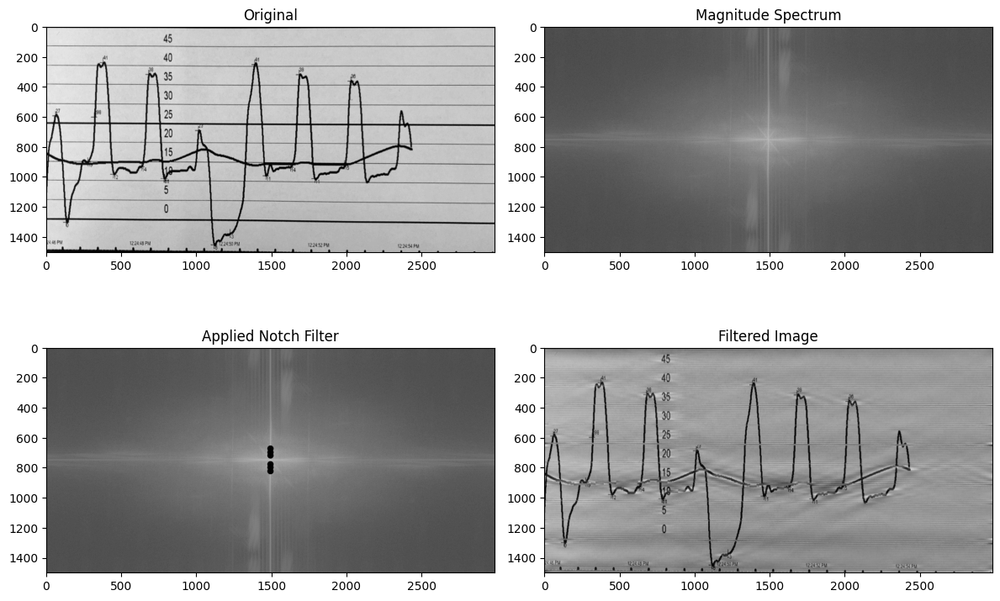

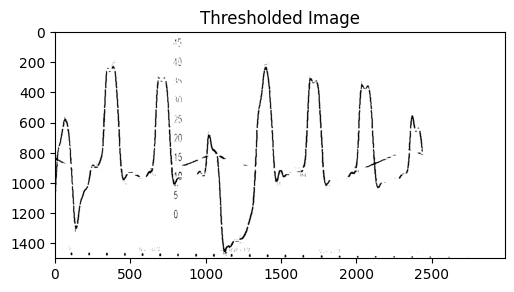

In [ ]:
# Apply multiple notch filters in a generic manner
img_shape = img.shape
NotchFilter = np.ones(img_shape)
for params in notch_params:
    NotchFilter *= notch_reject_filter(img_shape, *params)

# Apply the notch filter to the FFT of the image
NotchRejectCenter = fshift * NotchFilter
NotchReject = np.fft.ifftshift(NotchRejectCenter)
inverse_NotchReject = np.fft.ifft2(NotchReject)

# Visualize the results
Result = np.abs(inverse_NotchReject)

plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(img, cmap='gray')
plt.title('Original')

plt.subplot(222)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')

plt.subplot(223)
plt.imshow(magnitude_spectrum * NotchFilter, cmap='gray')
plt.title('Applied Notch Filter')

plt.subplot(224)
plt.imshow(Result, cmap='gray')
plt.title('Filtered Image')


plt.tight_layout()

# Threshold the resulting image based on brightness values
thresh_value = 50  # Set this value based on your needs
_, thresh_img = cv2.threshold(Result, thresh_value, 255, cv2.THRESH_BINARY)

# Visualize the results
plt.figure(figsize=(15, 10))


plt.subplot(235)
plt.imshow(thresh_img, cmap='gray')
plt.title('Thresholded Image')

plt.tight_layout()
plt.show()


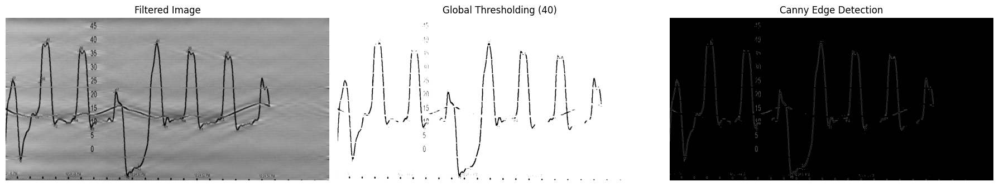

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ensure the image is in the proper format (uint8) and scale it if necessary
img_for_thresholding = (Result / Result.max() * 255).astype(np.uint8)

# Apply global thresholding with the chosen threshold value
_, img_binary = cv2.threshold(img_for_thresholding, 35, 255, cv2.THRESH_BINARY)

# Apply Canny edge detection to the binary image
edges = cv2.Canny(img_binary, 100, 200)

# Visualize the original, binary, and edge-detected images
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(Result, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(img_binary, cmap='gray')
plt.title('Global Thresholding (40)')
plt.axis('off')

plt.subplot(133)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()


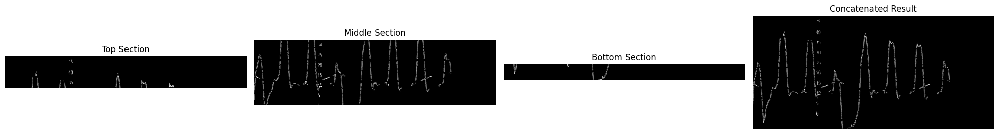

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the image as per your previous steps...
# [Your image loading and preprocessing code here]

# Split the image into three vertical sections
top_section = edges[0:400, :]
middle_section = edges[400:1200, :]
bottom_section = edges[1200:1400, :]

# Define Hough Line Transform parameters for each section
params_top = {'rho': 1, 'theta': np.pi/180, 'threshold': 10, 'minLineLength': 8, 'maxLineGap': 10}
params_middle = {'rho': 1, 'theta': np.pi/180, 'threshold': 10, 'minLineLength': 10, 'maxLineGap': 8}
params_bottom = {'rho': 1, 'theta': np.pi/180, 'threshold': 10, 'minLineLength': 8, 'maxLineGap': 10}

# Apply Hough Line Transform to each section with respective parameters
lines_top = cv2.HoughLinesP(top_section, **params_top)
lines_middle = cv2.HoughLinesP(middle_section, **params_middle)
lines_bottom = cv2.HoughLinesP(bottom_section, **params_bottom)

# Create black images to draw the lines on, for each section
img_lines_top = np.zeros_like(top_section)
img_lines_middle = np.zeros_like(middle_section)
img_lines_bottom = np.zeros_like(bottom_section)

# Draw the lines on respective black images
for lines, img_lines in zip([lines_top, lines_middle, lines_bottom],
                            [img_lines_top, img_lines_middle, img_lines_bottom]):
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(img_lines, (x1, y1), (x2, y2), 255, 2)

# Concatenate the processed sections back into a single image
concatenated_img_lines = np.vstack((img_lines_top, img_lines_middle, img_lines_bottom))

# Visualize the results
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
axs[0].imshow(img_lines_top, cmap='gray')
axs[0].set_title('Top Section')
axs[1].imshow(img_lines_middle, cmap='gray')
axs[1].set_title('Middle Section')
axs[2].imshow(img_lines_bottom, cmap='gray')
axs[2].set_title('Bottom Section')
axs[3].imshow(concatenated_img_lines, cmap='gray')
axs[3].set_title('Concatenated Result')

# Hide axes and display images
for ax in axs:
    ax.axis('off')
plt.tight_layout()
plt.show()


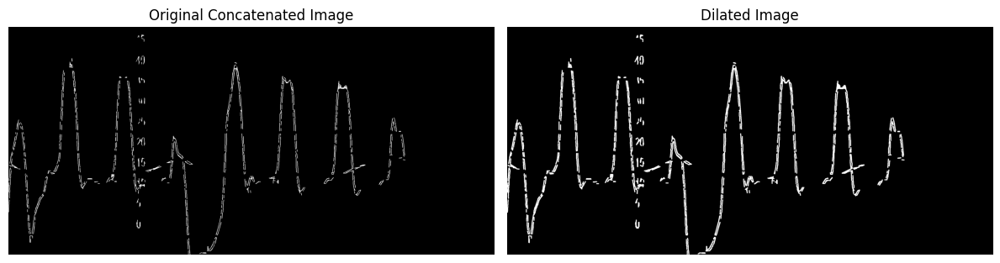

In [ ]:
# Define the dilation kernel
kernel_size = (4, 4)  # This defines a 5x5 rectangle. Adjust as needed.
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)

# Apply dilation to the concatenated image
dilated_img = cv2.dilate(concatenated_img_lines, kernel, iterations=1)

# Visualize the original and dilated images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(concatenated_img_lines, cmap='gray')
axs[0].set_title('Original Concatenated Image')
axs[1].imshow(dilated_img, cmap='gray')
axs[1].set_title('Dilated Image')

# Hide axes and display images
for ax in axs:
    ax.axis('off')
plt.tight_layout()
plt.show()





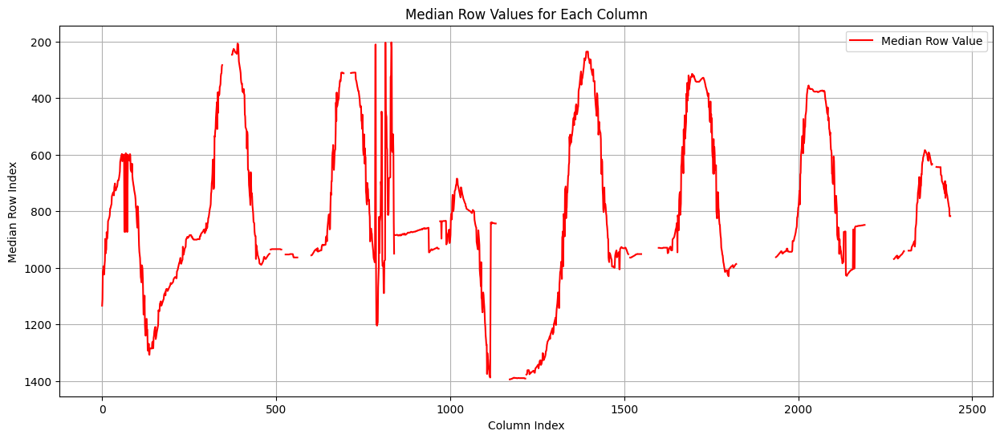

In [ ]:
# Extract median row values for each column
median_rows = []
cols = concatenated_img_lines.shape[1]

for col in range(cols):
    # Get non-zero row indices for the current column
    non_zero_rows = np.where(concatenated_img_lines[:, col] == 255)[0]
    if len(non_zero_rows) > 0:
        median_row = np.median(non_zero_rows)
        median_rows.append(median_row)
    else:
        median_rows.append(np.nan)  # No line in this column, append NaN

# Plot the segmented graph
plt.figure(figsize=(15, 6))
plt.plot(median_rows, 'r', label='Median Row Value')
plt.gca().invert_yaxis()  # Invert y-axis so the top of the image corresponds to lower values
plt.title('Median Row Values for Each Column')
plt.xlabel('Column Index')
plt.ylabel('Median Row Index')
plt.legend()
plt.grid(True)
plt.show()


<ipython-input-66-766f0b709af2>:2: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter


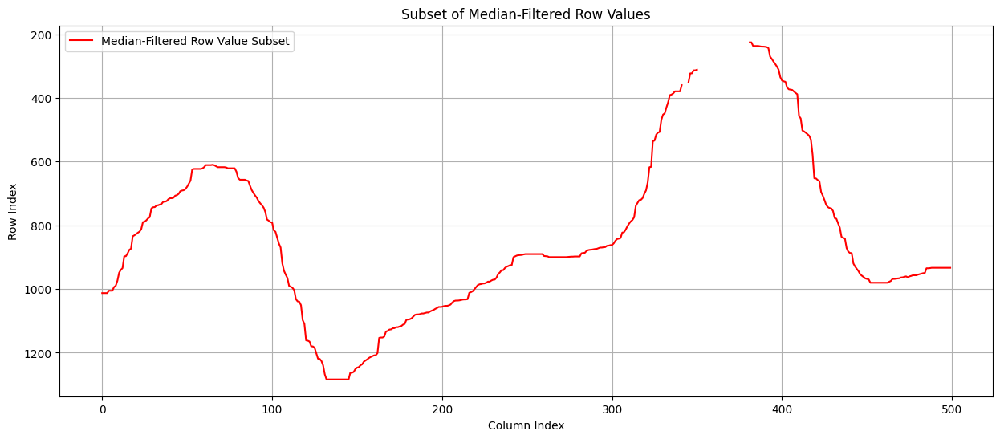

In [ ]:
import matplotlib.pyplot as plt
from scipy.ndimage.filters import median_filter

# Apply the median filter to the smoothed median row values
filtered_median_rows = median_filter(median_rows, size=20)  # Using a neighborhood size of 5

# Plotting a subset of the median-filtered row values
plt.figure(figsize=(15, 6))
plt.plot(filtered_median_rows[:500], 'r', label='Median-Filtered Row Value Subset')  # Plotting first 500 values
plt.gca().invert_yaxis()
plt.title('Subset of Median-Filtered Row Values')
plt.xlabel('Column Index')
plt.ylabel('Row Index')
plt.legend()
plt.grid(True)
plt.show()




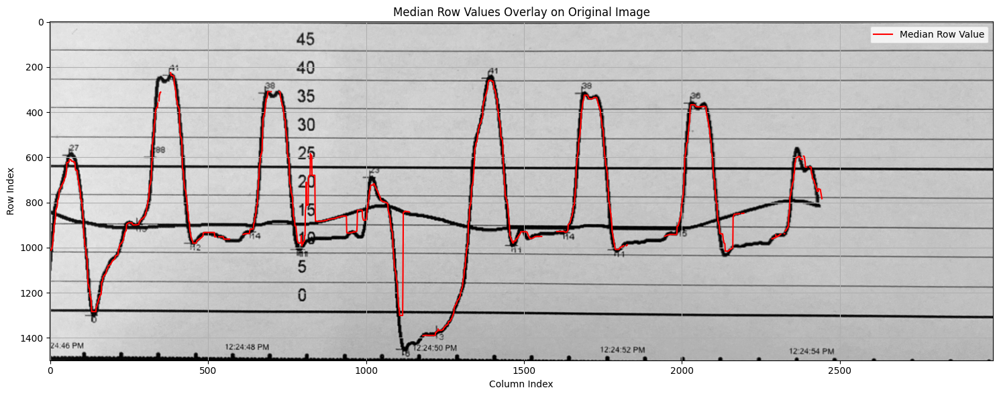

In [ ]:
# Display the original image
plt.figure(figsize=(15, 6))
img = cv2.imread('1214_rectified.jpg', 0)
img = img[:, 15:]
plt.imshow(img, cmap='gray', aspect='auto')


# Overlay the median row values
x_values = np.arange(img.shape[1])  # Corresponding x-values for each column
plt.plot(x_values, filtered_median_rows, 'r', label='Median Row Value')

# Set up the plot
plt.title('Median Row Values Overlay on Original Image')
plt.xlabel('Column Index')
plt.ylabel('Row Index')
plt.legend()
plt.grid(True)

# Display the combined image and graph
plt.tight_layout()
plt.savefig('overlayed_graph1.png', dpi=300)
plt.show()


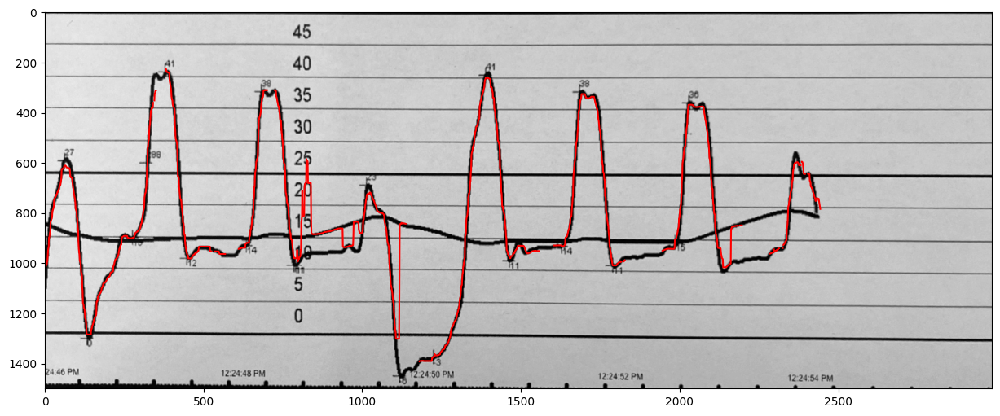

In [ ]:


# Display the original image
plt.figure(figsize=(15, 6))
plt.imshow(img, cmap='gray', aspect='auto')

# Overlay the median row values
x_values = np.arange(dilated_img.shape[1])  # Corresponding x-values for each column
plt.plot(x_values, filtered_median_rows, 'r', label='Median Row Value')

# # Set up the plot
# plt.title('Median Row Values Overlay on Original Image')
# plt.xlabel('Column Index')
# plt.ylabel('Row Index')
# plt.legend()
# plt.grid(True)

# # Display the combined image and graph
# plt.tight_layout()
# plt.savefig('overlayed_graph1.png', dpi=300)
# plt.show()


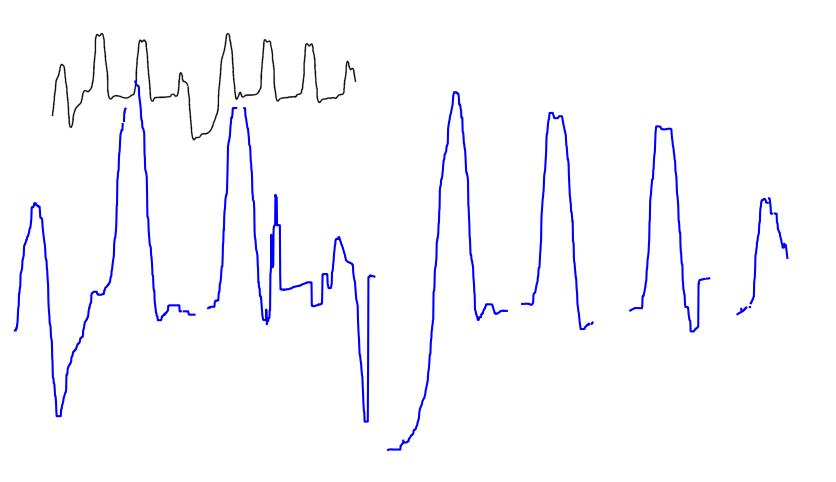

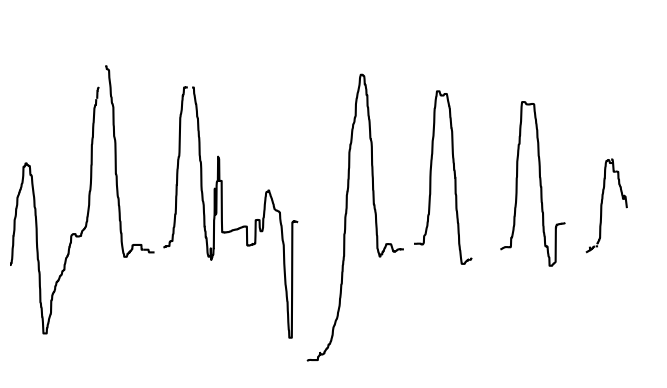

In [ ]:
truth_image = cv2.imread('1214_truth.png')

binary_truth = cv2.cvtColor(truth_image, cv2.COLOR_BGR2GRAY)
_, binary_truth_final = cv2.threshold(binary_truth, 100, 255, cv2.THRESH_BINARY)
plt.figure(figsize=(15, 6))
plt.imshow(binary_truth_final, cmap = 'gray')
plt.axis('off')
plt.plot(x_values + 15, filtered_median_rows, 'b', label='Median Row Value')
# plt.savefig('img1_results.png',bbox_inches=0, pad_inches=0)

results = np.ones((truth_image.shape[0], truth_image.shape[1]) ) * 255
plt.figure(figsize =(13.68, 4.79))
plt.imshow(results, cmap='gray', vmin=0, vmax=1)
plt.plot(x_values, filtered_median_rows, color='black')
plt.axis('off')
plt.savefig('1214_results.png',bbox_inches='tight', pad_inches=0)





(array([ 72,  72,  73, ..., 458, 458, 458]), array([208, 209, 207, ..., 667, 668, 669]))


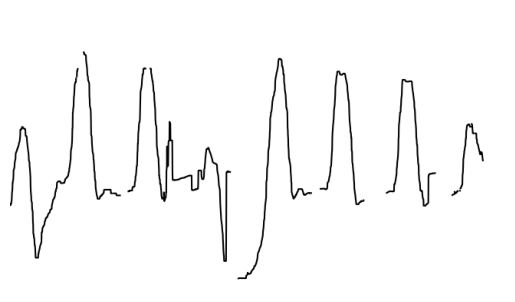

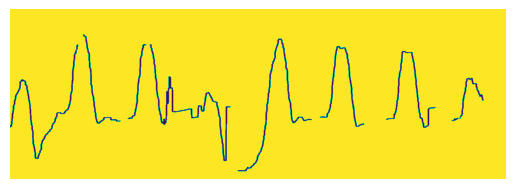

In [ ]:
result_image = cv2.imread('1214_results.png')

plt.figure()
plt.axis('off')
plt.imshow(result_image)

binary_result = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
binary_result= cv2.resize(binary_result, (binary_truth.shape[1],binary_truth.shape[0]))
_, binary_result_final = cv2.threshold(binary_result, 100, 255, cv2.THRESH_BINARY)
# print(binary_result)
print(np.where(binary_result_final==0))
plt.figure()
plt.axis('off')
plt.imshow(binary_result_final)

# Using segmented line

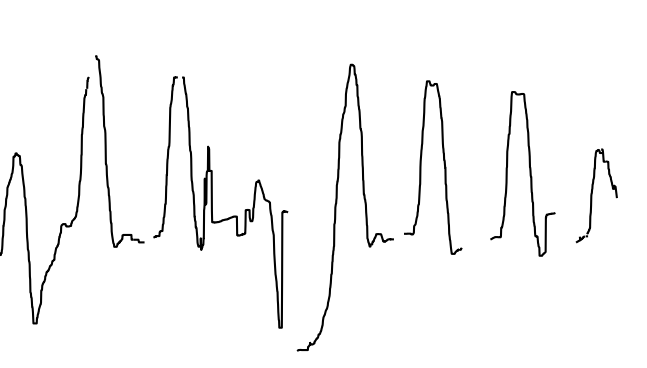

In [ ]:
image_seg = cv2.imread('1214_results.png')
image = cv2.cvtColor(image_seg, cv2.COLOR_BGR2GRAY)
cv2_imshow(image)


[[ 430 1206]
 [ 430 1207]
 [ 430 1208]
 ...
 [2741 3918]
 [2741 3919]
 [2741 3920]]


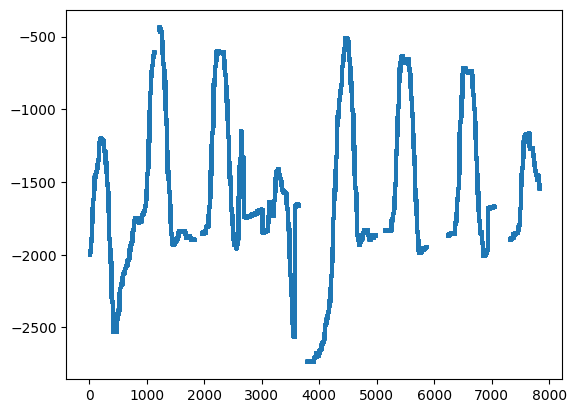

In [ ]:
# Threshold the image to get binary image
_, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY_INV)
resized_binary_image = cv2.resize(binary_image, (8208, 2874), interpolation=cv2.INTER_NEAREST)
# Find the coordinates of the points on the graph line
coordinates = np.column_stack(np.where(resized_binary_image > 0))
print(coordinates) #it is (y,x) (0,0) at top right

# Since the image is quite large, we can plot a small sample of the points to verify
plt.scatter(coordinates[:, 1], -coordinates[:, 0], s=1)  # plotting all points
plt.show()


In [ ]:
from datetime import timedelta

# Flip coordinates to (x,y)
coordinates = coordinates[:, [1, 0]]

# Define the base point for translation and scaling factors
base_x, base_y = x1, closest_line[1]
multiply_x, multiply_y = scale, scaleY

# Initialize an empty list to store new coordinates
new_coordinates = []

# Apply transformation to each coordinate pair
for coord in coordinates:
    dif_x, dif_y = coord[0] - base_x, base_y - coord[1]
    # seconds_to_add = timedelta(seconds=dif_x * multiply_x)
    # Add the timedelta to time1
    # new_x = time1 + seconds_to_add
    new_x = time1 + dif_x * multiply_x
    new_y = dif_y * multiply_y + 0
    new_coordinates.append([new_x, new_y])

new_coordinates.sort(key=lambda x: x[0])
print(new_coordinates[:50])


NameError: ignored

In [ ]:
import matplotlib.dates as mdates

# Plotting the new coordinates
times = [coord[0] for coord in new_coordinates]
values = [coord[1] for coord in new_coordinates]

n = 1000  # Adjust this number as needed
sampled_times = times[::n]
sampled_values = values[::n]

plt.figure(figsize=(10, 6))
plt.plot(sampled_times, sampled_values, marker='.')

# Formatting the x-axis to display dates properly

print(sampled_times)

plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Transformed Coordinates Over Time (Sampled)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

NameError: ignored

In [ ]:
import pandas as pd

# Load the data without considering the first row as header
data_no_header = pd.read_csv("1214d.csv", header=None)

# Converting the data into an array of points (tuples)
points_array_no_header = list(zip(data_no_header[0], data_no_header[1]))

print(points_array_no_header)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
transformed_points = np.array(new_coordinates)
csv_points = np.array(points_array_no_header)
print(csv_points.shape)
print(transformed_points.shape)

In [ ]:
sample_interval_transformed = len(transformed_points) // len(csv_points)
shrunken_transformed_points = transformed_points[::sample_interval_transformed]
shrunken_transformed_points = shrunken_transformed_points[:len(csv_points)]

# MSE and MAE calculations
mse_points = mean_squared_error(csv_points, shrunken_transformed_points)
mae = mean_absolute_error(csv_points, shrunken_transformed_points)
rmse = np.sqrt(mse_points)

# Outputting MSE, MAE, and RMSE
print("MSE:", mse_points)
print("MAE:", mae)
print("RMSE:", rmse)

# Printing a portion of the arrays for comparison
print(shrunken_transformed_points[:-40], csv_points[:-40])

output_file_path = '/content/shrunken_transformed_points.csv'
pd.DataFrame(shrunken_transformed_points).to_csv(output_file_path, index=False)
output_file_path



In [ ]:
import matplotlib.pyplot as plt

# Plotting the shrunken_transformed_points
plt.figure(figsize=(10, 6))
plt.scatter(csv_points[:, 0], csv_points[:, 1], alpha=0.6)
plt.title('Scatter Plot of Ground Truth')
plt.xlabel('X Values')
plt.ylabel('Y Values')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Plotting the shrunken_transformed_points
plt.figure(figsize=(10, 6))
plt.scatter(shrunken_transformed_points[:, 0], shrunken_transformed_points[:, 1], alpha=0.6)
plt.title('Scatter Plot of our calculated values')
plt.xlabel('X Values')
plt.ylabel('Y Values')
plt.show()

